# Interactive map: employment rates in Finland

**Goal:** plot interactive map of employment rates across Finnish regions.

In [1]:
# import libraries
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
%matplotlib inline

### Employment rate data

Employment rate refers to the proportion of the employed among people aged 15 to 64. Data from Statistics Finland

In [2]:
# read employment data
data = pd.read_csv("data/seutukunta_tyollisyys_2013.csv", sep=",")
data.head(2)

,seutukunta,seutukunta_nimi,tyollisyys
0,SK011,Helsingin seutukunta,73.0
1,SK014,Raaseporin seutukunta,70.3


### Sub-regional units

The spatial data can be obtained from the Statistics Finland Web Feature Service
`http://geo.stat.fi/geoserver/tilastointialueet/wfs`

In [3]:
# get features directly from wfs
url = "http://geo.stat.fi/geoserver/tilastointialueet/wfs?request=GetFeature&typename=tilastointialueet:seutukunta1000k_2018&outputformat=JSON"
geodata = gpd.read_file(url)

In [4]:
geodata.head(3)

,id,vuosi,seutukunta,nimi,namn,name,geometry
0,seutukunta1000k_2018.1,2018,011,Helsinki,Helsingfors,Helsinki,"MULTIPOLYGON (((409963.522 6681658.341, 409969..."
1,seutukunta1000k_2018.2,2018,014,Raasepori,Raseborg,Raasepori,"MULTIPOLYGON (((306616.919 6665438.489, 306668..."
2,seutukunta1000k_2018.3,2018,015,Porvoo,Borgå,Porvoo,"MULTIPOLYGON (((427108.141 6694151.025, 427175..."


### Join employment data with geometries

We can join two data sets based on the common field 'seutukunta'. The region codes in the data file contain additional letters 'SK' which we need to remove before join

In [5]:
data['seutukunta'] = data['seutukunta'].apply(lambda x: x[2:])
data['seutukunta'].head(3)

0    011
1    014
2    015
Name: seutukunta, dtype: object

In [6]:
print('Number of employment records ', len(data))
print('Number of region records ', len(geodata))

# merge two data sets
geodata = geodata.merge(data, on='seutukunta')

print('Number of records after join', len(geodata))

geodata.head(3)

Number of employment records  70
Number of region records  70
Number of records after join 70


,id,vuosi,seutukunta,nimi,namn,name,geometry,seutukunta_nimi,tyollisyys
0,seutukunta1000k_2018.1,2018,011,Helsinki,Helsingfors,Helsinki,"MULTIPOLYGON (((409963.522 6681658.341, 409969...",Helsingin seutukunta,73.0
1,seutukunta1000k_2018.2,2018,014,Raasepori,Raseborg,Raasepori,"MULTIPOLYGON (((306616.919 6665438.489, 306668...",Raaseporin seutukunta,70.3
2,seutukunta1000k_2018.3,2018,015,Porvoo,Borgå,Porvoo,"MULTIPOLYGON (((427108.141 6694151.025, 427175...",Porvoon seutukunta,74.3


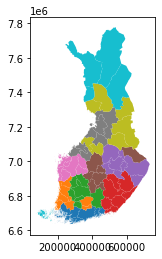

In [7]:
# create a static map to visualize employment
geodata.plot(column='seutukunta');

The static map can be improved by adding a scale, tool tips and a better color scheme.
Also, several layers can be mapped and switched on/off 

### Create an interactive map

Next, I will plot an interactive map based on the same data, using folium library

In [11]:
# add geo-id, required by Folium
geodata['geoid'] = geodata.index.astype(str)

# add a map instance centering at Helsinki
m = folium.Map(location=[60.25, 24.8],
               tiles='cartodbpositron',
               zoom_start=8, 
               control_scale=True
              )

# add choropleth
folium.Choropleth(geo_data=geodata,
                  data=geodata,
                  columns=['geoid', 'tyollisyys'],
                  key_on='feature.id',
                  fill_color='RdYlBu',
                  line_color='white',
                  line_weight=0,
                  legend_name='Employment rate in Finland'
                 ).add_to(m)

# add tool tips
folium.features.GeoJson(geodata,
                        name='Labels',
                        style_function=lambda x: {'color':'transparent',
                                                  'fillColor':'transparent',
                                                  'weight':0
                                                 },
                        tooltip=folium.features.GeoJsonTooltip(fields=['tyollisyys','seutukunta'],
                                                               aliases=['Employment rate', 'Region'],
                                                               labels=True,
                                                               sticky=False
                                                              )
                       ).add_to(m)

# add layer control
folium.LayerControl().add_to(m)

# show 
m

In [12]:
# export html file
outfp="docs/interactive_map_employment_rate.html"
m.save(outfp)